# Study Notes: Padding & Strides in Convolutional Neural Networks (CNNs)

---
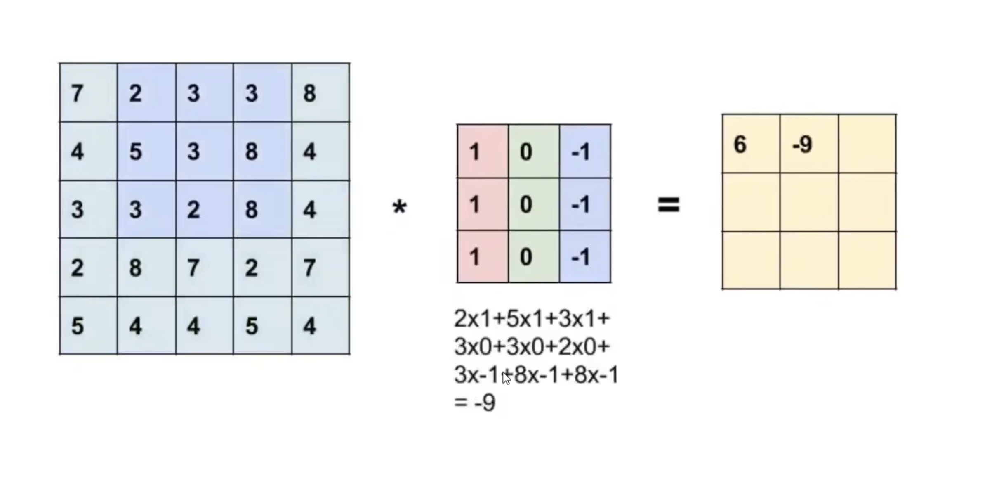

## Topic 1: Introduction to Padding – Why It's Needed

### 1. Introduction

**What is Padding?**
Padding is the process of adding extra pixels (typically zeros) around the border of an input image before applying a convolution operation.

**Why is it important?**
When we apply convolution filters to an image, two major problems occur:

1. **Shrinking output size** – Each convolution reduces the image dimensions, and after multiple layers, the image becomes too small.
2. **Border pixels are underrepresented** – Pixels at the edges/corners of the image are used in fewer convolution operations than center pixels, making them less important in the final feature map.

**Real-life use:**
Padding ensures that:
- The output size remains manageable across many layers
- Edge information is preserved and given equal importance
- We can build deeper networks without losing spatial resolution

---

### 2. Detailed Explanation

#### Problem 1: Shrinking Output Size

When you apply a filter (kernel) to an image, the output feature map is smaller than the input.
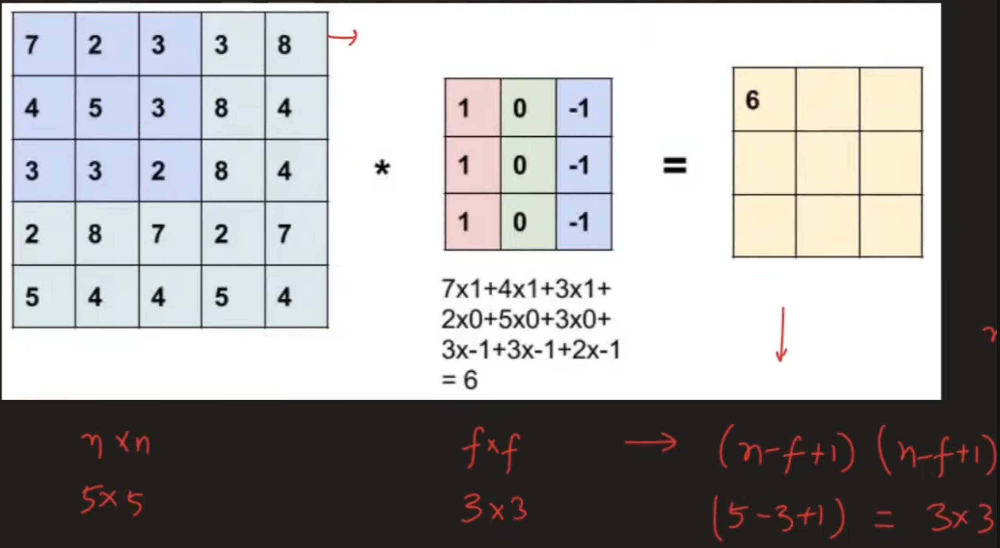
**Example:**
- Input image size: **5 × 5**
- Filter size: **3 × 3**
- Output feature map size: **3 × 3**

**Formula without padding:**
> Output size = N − F + 1

Where:
- **N** = input size (e.g., 5)
- **F** = filter size (e.g., 3)

So: **5 − 3 + 1 = 3**

If you apply another convolution layer, the size reduces further. After multiple layers, the image loses too much information.

---

#### Problem 2: Border Pixels Are Ignored

- **Center pixels** participate in many convolution operations (3–4 times).
- **Border/corner pixels** participate in only 1–2 operations.

This means the feature map focuses more on the center, ignoring important information at the edges. This is not ideal because edges often contain crucial patterns (like object boundaries).

---

#### How Padding Solves These Problems
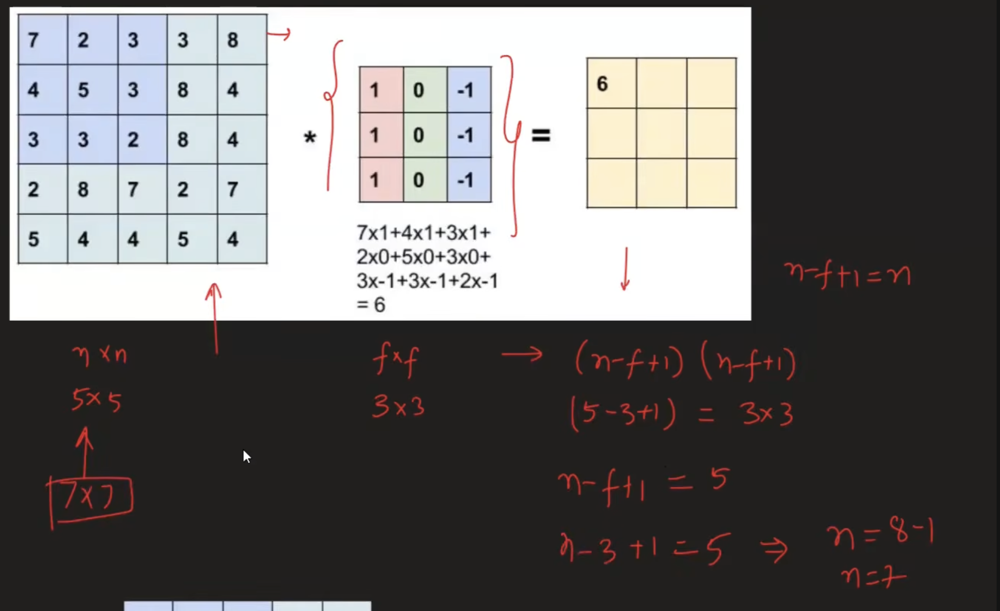

**Padding** adds extra rows and columns around the image border. Usually, we add **zeros** (this is called **zero-padding**).

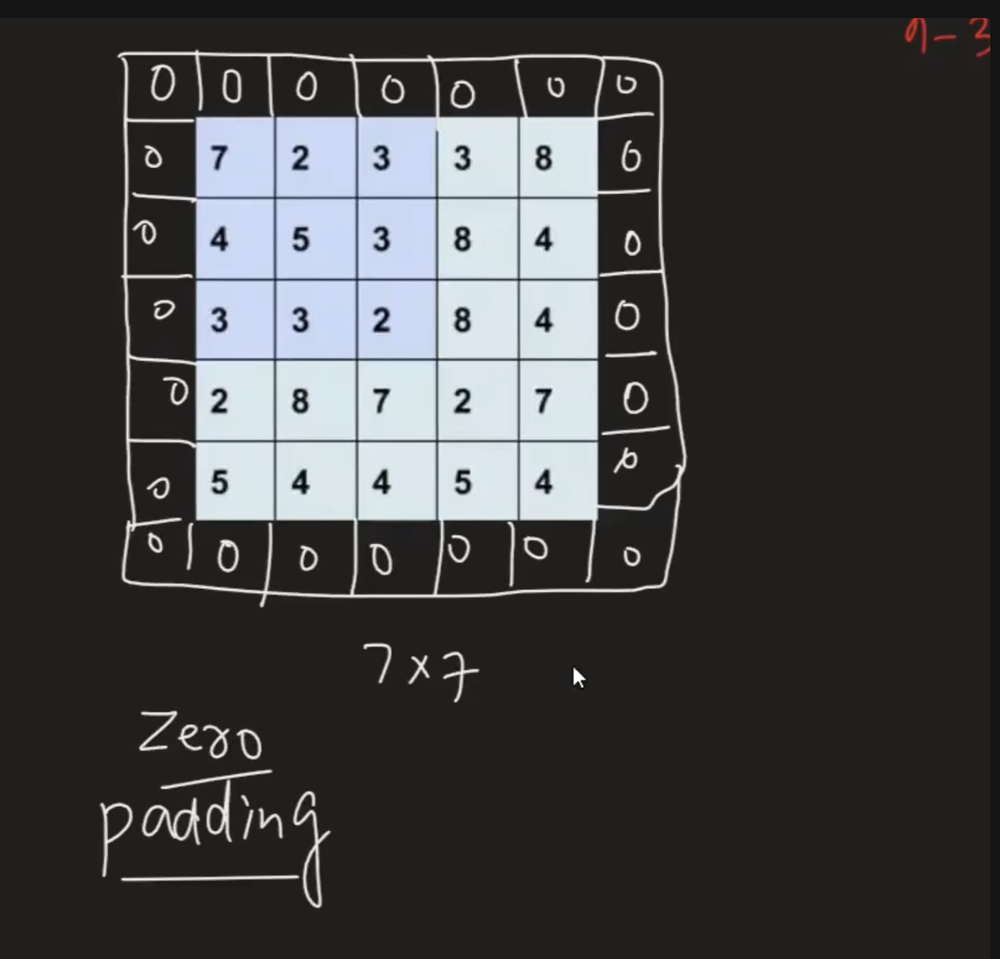

**Example with padding:**
- Original image: **5 × 5**
- Add 1 row/column on each side → becomes **7 × 7**
- Apply **3 × 3** filter
- Output: **7 − 3 + 1 = 5**

Now the output is **5 × 5** — the same size as the input!

**Visual:**
```
Original:          Padded (1 layer of zeros):
[1 2 3 4 5]        [0 0 0 0 0 0 0]
[6 7 8 9 0]        [0 1 2 3 4 5 0]
[1 2 3 4 5]   →    [0 6 7 8 9 0 0]
[6 7 8 9 0]        [0 1 2 3 4 5 0]
[1 2 3 4 5]        [0 6 7 8 9 0 0]
                   [0 1 2 3 4 5 0]
                   [0 0 0 0 0 0 0]
```

---

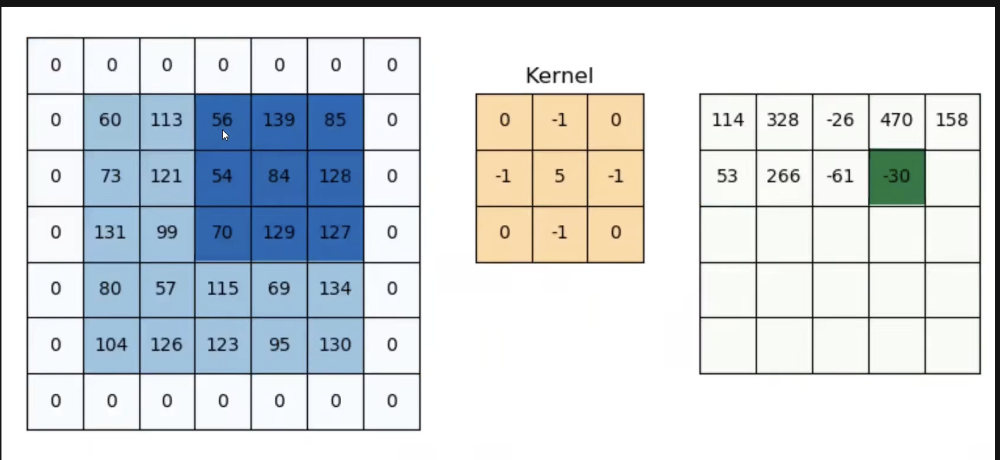

#### Formula with Padding

> **Output size = N + 2P − F + 1**

Where:
- **N** = input size
- **P** = padding amount (number of layers added on each side)
- **F** = filter size

**Example:**
- N = 5, P = 1, F = 3
- Output = 5 + 2(1) − 3 + 1 = 5 + 2 − 3 + 1 = **5**

---

#### Types of Padding

| Type | Description |
|------|-------------|
| **Valid Padding** | No padding applied. Output shrinks. |
| **Same Padding** | Padding is added so output size equals input size. The required padding is calculated automatically. |

**For "same" padding:**
> P = (F − 1) / 2

(For odd filter sizes like 3×3, P = 1)

---

### 3. Key Points

- Padding adds extra pixels (usually zeros) around the image border.
- It prevents the output from shrinking after convolution.
- It ensures border pixels get equal importance as center pixels.
- **Zero-padding** means all added pixels have value 0.
- **Valid padding** = no padding.
- **Same padding** = output size equals input size.
- Formula: **Output = N + 2P − F + 1**

---

### 4. Common Mistakes

| Mistake | Why It's Wrong | How to Avoid |
|---------|---------------|--------------|
| Thinking padding adds random values | Padding typically adds zeros, not random numbers | Remember it's called **zero-padding** |
| Forgetting to include padding in the formula | Without P, the formula gives wrong output size | Always use: N + 2P − F + 1 |
| Applying padding only when needed | Padding is almost always beneficial | Use same padding by default in deep networks |
| Confusing padding with stride | They serve different purposes | Padding controls border treatment; stride controls step size |

---

### 5. Interview/Exam Questions

**Q1: Why do we need padding in CNNs?**
> **A:** To prevent the feature map from shrinking after each convolution and to ensure edge pixels contribute equally to the final output.

**Q2: What is zero-padding?**
> **A:** Adding rows and columns of zeros around the image border before convolution.

**Q3: Calculate the output size if input is 7×7, filter is 3×3, and padding is 1.**
> **A:** 7 + 2(1) − 3 + 1 = **7** (same size)

**Q4: What is the difference between valid and same padding?**
> **A:** Valid = no padding (output shrinks). Same = padding added so output = input size.

---

### 6. Revision Notes

- **Padding** = adding zeros around image border
- Solves: (1) shrinking size, (2) ignoring border pixels
- Formula: **N + 2P − F + 1**
- **Valid** = P = 0
- **Same** = output size = input size
- Common padding value: **1** for 3×3 filters

---



# Topic 2: Strides in Convolutional Neural Networks (CNNs)

---

## 1. Introduction

**What are Strides?**
Stride is the number of pixels by which the filter (kernel) shifts or moves across the input image during the convolution operation.

**Why is it important?**
The stride determines:
- How much the filter "jumps" between positions
- The size of the output feature map
- How much information is captured vs. skipped

**Real-life use:**
Strides help us:
- Reduce computational cost by skipping some positions
- Control the output size without using pooling layers
- Decide whether we want to capture fine details (small stride) or high-level coarse features (large stride)

---

## 2. Detailed Explanation

### Default Stride: Stride = 1
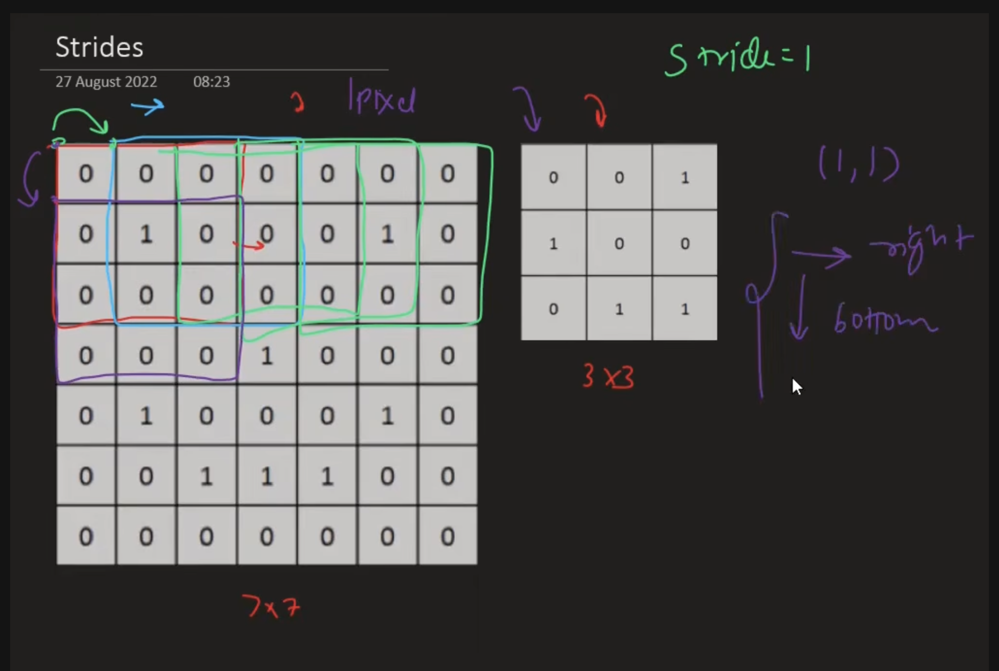
In standard convolution, after performing the element-wise multiplication and addition at one position, we shift the filter by **1 pixel** to the right.

**Movement pattern (Stride = 1):**
- Move **1 pixel right** → perform convolution
- Continue until reaching the right edge
- Then move **1 pixel down**
- Repeat until the entire image is covered

This means the filter visits **every possible position** on the image.

---

### Changing the Stride

You can increase the stride to skip positions.

**Stride = 2 (visual example with 7×7 image and 3×3 filter):**

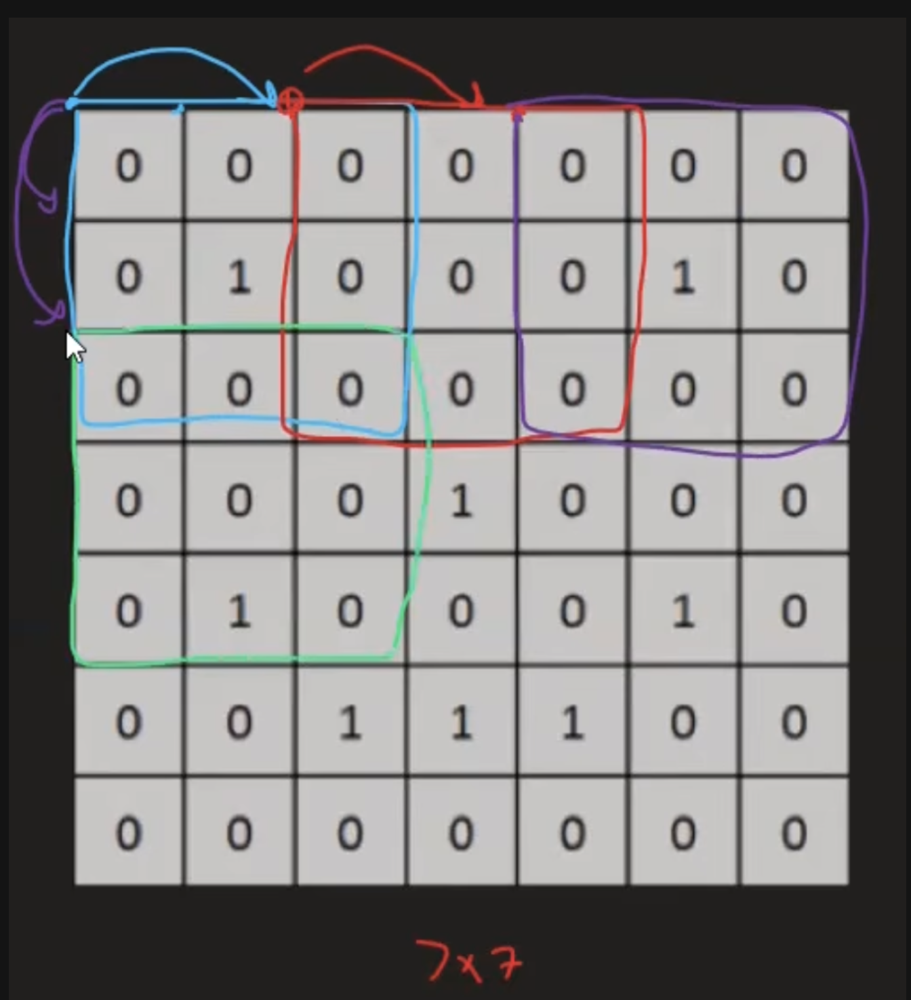
```
Positions visited:
Step 1: Top-left (0,0)     → convolution
Step 2: Move right 2 → (0,2) → convolution
Step 3: Move right 2 → (0,4) → convolution
Step 4: Move down 2 → (2,0) → convolution
Step 5: (2,2) → convolution
Step 6: (2,4) → convolution
Step 7: (4,0) → convolution
Step 8: (4,2) → convolution
Step 9: (4,4) → convolution
```

**Notice:** We completely skip positions like (0,1), (0,3), (1,0), etc.

---

### Formula with Stride
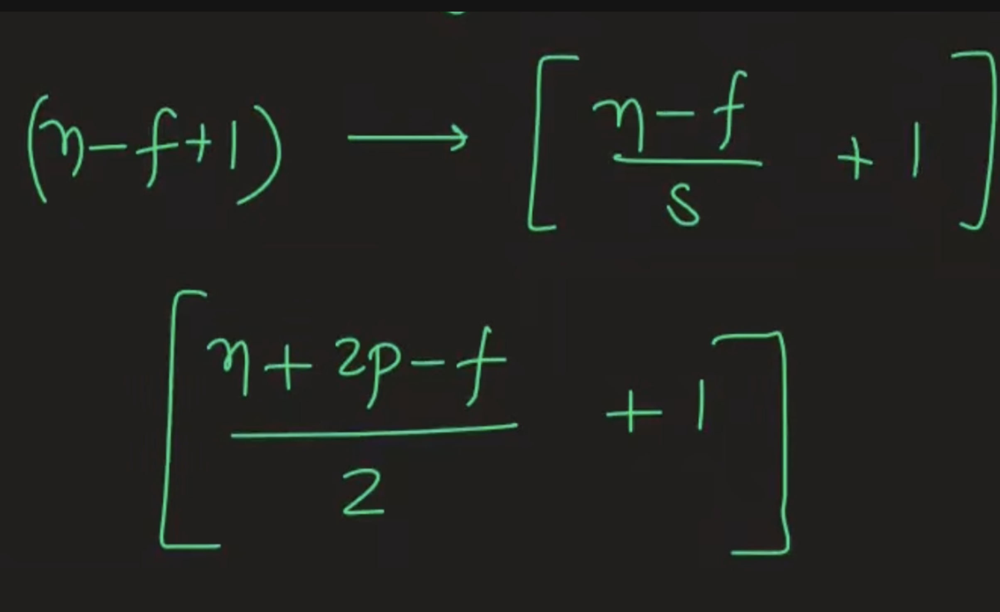
> **Output size = floor((N − F) / S) + 1**

Where:
- **N** = input size
- **F** = filter size
- **S** = stride value

**With padding:**
> **Output size = floor((N + 2P − F) / S) + 1**

---

### Example 1: Stride = 2 (No Padding)

- Input: **7 × 7**
- Filter: **3 × 3**
- Stride: **2**

**Calculation:**
```
Output = floor((7 − 3) / 2) + 1
       = floor(4 / 2) + 1
       = 2 + 1
       = 3
```

So output is **3 × 3**

---

### Example 2: Special Case – Incomplete Positions

**Problem:**
- Input: **6 × 6**
- Filter: **3 × 3**
- Stride: **2**

**Calculation:**
```
Output = floor((6 − 3) / 2) + 1
       = floor(3 / 2) + 1
       = 1 + 1
       = 2
```

But wait! Let's see the positions:

**Visualizing:**
```
Positions with stride = 2 on 6×6 image:
Step 1: (0,0) ✓
Step 2: (0,2) ✓
Step 3: (0,4) ✓ 
Step 4: (2,0) ✓
Step 5: (2,2) ✓
Step 6: (2,4) ✓
Step 7: (4,0) ✓
Step 8: (4,2) ✓
Step 9: (4,4) → filter would go out of bounds! ✗
```

The last position (4,4) would require pixels beyond the image boundary. Since we can't perform convolution there, we **floor** the value.

**Formula gives:**
```
floor((6-3)/2) + 1 = floor(1.5) + 1 = 1 + 1 = 2
```

**Key Rule:** Whenever you get a decimal value after division, **floor it** (take the integer part).

---

### Why Use Larger Strides?

| Reason | Explanation |
|--------|-------------|
| **Capture high-level features** | Larger stride skips fine details (nuances) and only captures coarse/high-level patterns |
| **Reduce computation** | Fewer positions = faster training, less memory usage |
| **Downsampling** | Reduces feature map size without needing pooling layers |

**When to use:**
- When you don't need low-level details (e.g., classifying large objects)
- When working with very large datasets and need faster training
- As an alternative to pooling layers

**When NOT to use:**
- When you need to capture fine-grained details (e.g., medical imaging, facial features)
- When the image contains small objects
- When preserving spatial information is critical

---

### Multiple Strides (Different for Height and Width)

You can use different stride values for vertical and horizontal movement:

**Example:** Stride = (2, 3)
- Move **2 pixels** horizontally
- Move **3 pixels** vertically

This is useful when the image has different aspect ratios or when you want non-uniform downsampling.

---

## 3. Key Points

- **Stride** = number of pixels the filter jumps each step
- Default stride = **1** (visits every position)
- Increasing stride = **smaller output** and **less computation**
- Formula: **floor((N − F) / S) + 1** (without padding)
- Formula with padding: **floor((N + 2P − F) / S) + 1**
- If division gives a decimal, **floor it** (drop the decimal part)
- **Stride ≠ Padding** – they serve different purposes
- Stride controls step size; padding controls border handling

---

## 4. Code Example (from transcript)

### Implementing Strides in Keras/TensorFlow

```python
from tensorflow.keras import layers

# Creating a convolutional layer with stride = 2
conv_layer = layers.Conv2D(
    filters=32,          # 32 filters
    kernel_size=3,       # 3×3 filter
    strides=2,           # Stride of 2 in both directions
    padding='valid',     # No padding
    input_shape=(28, 28, 1)  # Input: 28×28 grayscale image
)
```

### Stride = (2, 2) – Different from default

```python
# Stride of 2 both horizontally and vertically
conv_layer = layers.Conv2D(
    filters=32,
    kernel_size=3,
    strides=(2, 2),      # Moves 2 pixels right and 2 pixels down
    padding='same'       # Keeps output size same
)
```

**Observation from the transcript:**
- Input: 28×28
- With stride = 2, the output becomes 14×14 (approx half)
- Formula: floor((28 − 3) / 2) + 1 = floor(25/2) + 1 = 12 + 1 = 13

---

## 5. Common Mistakes

| Mistake | Why It's Wrong | How to Avoid |
|---------|---------------|--------------|
| Confusing stride with filter size | Stride is how much we move, not the filter dimensions | Stride = jump size; kernel = window size |
| Forgetting to floor the division | Decimal values must be floored to get valid output size | Always use: floor((N − F) / S) + 1 |
| Thinking larger stride is always better | Larger stride loses details; use only when appropriate | Consider your problem – fine details need stride=1 |
| Using stride to compensate for no padding | Different purposes; don't confuse them | Padding preserves borders; stride reduces size |
| Not accounting for stride in output dimension | The formula changes with stride | Always use the stride formula |

---

## 6. Interview/Exam Questions

**Q1: What is stride in CNN?**
> **A:** The number of pixels the filter shifts between convolution operations. Default is 1.

**Q2: Calculate output size if input is 11×11, filter is 3×3, and stride is 2.**
> **A:** floor((11 − 3) / 2) + 1 = floor(8/2) + 1 = 4 + 1 = **5**

**Q3: What happens if stride gives a decimal value?**
> **A:** We floor the value (take the integer part) because we can't perform convolution on incomplete positions.

**Q4: Why would you use stride > 1?**
> **A:** To capture high-level coarse features, reduce computation, and decrease feature map size without pooling.

**Q5: Can stride and padding be used together?**
> **A:** Yes. Formula: floor((N + 2P − F) / S) + 1

**Q6: What's the difference between stride=1 and stride=2?**
> **A:** Stride=1 visits every position (captures fine details). Stride=2 skips every other position (captures coarse features, reduces computation).

---

## 7. Revision Notes

- **Stride (S)** = filter jump size
- Default: **S = 1**
- Formula: **floor((N − F) / S) + 1**
- With padding: **floor((N + 2P − F) / S) + 1**
- **Larger stride** = smaller output, faster, less detail
- **Smaller stride** = larger output, slower, more detail
- **Floor** any decimal values
- Combined with padding: output = **floor((N + 2P − F) / S) + 1**

---



# Topic 3: Code Implementation & Summary of Padding and Strides in CNNs

---

## 1. Introduction

Now that we understand the concepts of padding and strides, let's see how they are actually implemented in code using popular deep learning frameworks. This bridges the gap between theory and practice, showing you exactly how to apply these operations in real CNN models.

**Why this matters:**
- You'll be able to build CNN architectures from scratch
- You can experiment with different padding and stride values
- You'll understand model summaries and output dimensions

---

## 2. Detailed Explanation: Code Walkthrough

The transcript demonstrates two Keras/TensorFlow implementations:

### Implementation 1: Without Padding (Valid Padding)

```python
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import mnist

# Load MNIST dataset (handwritten digits)
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# Build the model
model = models.Sequential()

# First convolutional layer - NO padding
model.add(layers.Conv2D(
    filters=32,              # 32 filters
    kernel_size=3,           # 3×3 filter size
    padding='valid',         # NO padding (default)
    input_shape=(28, 28, 1)  # Input: 28×28 grayscale image
))

# Second convolutional layer - NO padding
model.add(layers.Conv2D(
    filters=32,
    kernel_size=3,
    padding='valid'
))

# Third convolutional layer - NO padding
model.add(layers.Conv2D(
    filters=32,
    kernel_size=3,
    padding='valid'
))

# Flatten for fully connected layers
model.add(layers.Flatten())
model.add(layers.Dense(10, activation='softmax'))  # 10 classes (digits 0-9)
```

**What happens with valid padding:**

| Layer | Input Size | Calculation | Output Size |
|-------|-----------|-------------|-------------|
| Input | 28×28 | - | 28×28 |
| Conv1 | 28×28 | 28−3+1 | 26×26 |
| Conv2 | 26×26 | 26−3+1 | 24×24 |
| Conv3 | 24×24 | 24−3+1 | 22×22 |

**Observation:** The image shrinks after every convolution layer. After 3 layers, it's down from 28×28 to 22×22.

---

### Implementation 2: With Padding (Same Padding)

```python
model = models.Sequential()

# First convolutional layer - WITH padding
model.add(layers.Conv2D(
    filters=32,
    kernel_size=3,
    padding='same',          # Padding added to preserve size
    input_shape=(28, 28, 1)
))

# Second convolutional layer - WITH padding
model.add(layers.Conv2D(
    filters=32,
    kernel_size=3,
    padding='same'
))

# Third convolutional layer - WITH padding
model.add(layers.Conv2D(
    filters=32,
    kernel_size=3,
    padding='same'
))

model.add(layers.Flatten())
model.add(layers.Dense(10, activation='softmax'))
```

**What happens with same padding:**

| Layer | Input Size | Calculation | Output Size |
|-------|-----------|-------------|-------------|
| Input | 28×28 | - | 28×28 |
| Conv1 | 28×28 | 28 + 2(1) − 3 + 1 | 28×28 |
| Conv2 | 28×28 | 28 + 2(1) − 3 + 1 | 28×28 |
| Conv3 | 28×28 | 28 + 2(1) − 3 + 1 | 28×28 |

**Observation:** The image size remains 28×28 throughout all convolution layers. **No information loss!**

---

### Implementation 3: With Strides

```python
model = models.Sequential()

# Convolutional layer with stride = 2
model.add(layers.Conv2D(
    filters=32,
    kernel_size=3,
    strides=2,               # Stride of 2 in both directions
    padding='valid',
    input_shape=(28, 28, 1)
))

# Second layer with stride = 2
model.add(layers.Conv2D(
    filters=32,
    kernel_size=3,
    strides=2,
    padding='valid'
))

# Third layer with stride = 2
model.add(layers.Conv2D(
    filters=32,
    kernel_size=3,
    strides=2,
    padding='valid'
))

model.add(layers.Flatten())
model.add(layers.Dense(10, activation='softmax'))
```

**What happens with stride = 2:**

| Layer | Input Size | Calculation | Output Size |
|-------|-----------|-------------|-------------|
| Input | 28×28 | - | 28×28 |
| Conv1 | 28×28 | floor((28−3)/2) + 1 = floor(25/2) + 1 = 12 + 1 | 13×13 |
| Conv2 | 13×13 | floor((13−3)/2) + 1 = floor(10/2) + 1 = 5 + 1 | 6×6 |
| Conv3 | 6×6 | floor((6−3)/2) + 1 = floor(3/2) + 1 = 1 + 1 | 2×2 |

**Observation:** The image shrinks rapidly with stride=2. After 3 layers, it's down from 28×28 to 2×2 — a massive reduction!

---

### Complete Implementation Comparison

```python
# Import required libraries
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import mnist

# Load data
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.reshape(-1, 28, 28, 1).astype('float32') / 255.0
x_test = x_test.reshape(-1, 28, 28, 1).astype('float32') / 255.0

# Option 1: No padding (valid)
model_valid = models.Sequential([
    layers.Conv2D(32, 3, padding='valid', input_shape=(28, 28, 1)),
    layers.Conv2D(32, 3, padding='valid'),
    layers.Conv2D(32, 3, padding='valid'),
    layers.Flatten(),
    layers.Dense(10, activation='softmax')
])

# Option 2: With padding (same)
model_same = models.Sequential([
    layers.Conv2D(32, 3, padding='same', input_shape=(28, 28, 1)),
    layers.Conv2D(32, 3, padding='same'),
    layers.Conv2D(32, 3, padding='same'),
    layers.Flatten(),
    layers.Dense(10, activation='softmax')
])

# Option 3: With strides
model_stride = models.Sequential([
    layers.Conv2D(32, 3, strides=2, padding='valid', input_shape=(28, 28, 1)),
    layers.Conv2D(32, 3, strides=2, padding='valid'),
    layers.Conv2D(32, 3, strides=2, padding='valid'),
    layers.Flatten(),
    layers.Dense(10, activation='softmax')
])

# Print summaries to see output shapes
model_valid.summary()
model_same.summary()
model_stride.summary()
```

---

## 3. Key Points

- **`padding='valid'`** = No padding (output shrinks)
- **`padding='same'`** = Automatic padding to keep output = input size
- **`strides=2`** = Moves filter by 2 pixels (skips positions)
- **`strides=(2,2)`** = Different strides for height and width
- Always check `model.summary()` to verify output shapes
- Flatten converts 2D feature maps to 1D for fully connected layers

---

## 4. Syntax/Structure Explained

### Convolutional Layer Syntax (Keras)

```python
layers.Conv2D(
    filters,          # Number of output channels (filters)
    kernel_size,      # Size of filter (e.g., 3 for 3×3)
    strides=1,        # Default stride (optional)
    padding='valid',  # 'valid' or 'same' (optional)
    input_shape=()    # Input dimensions (only first layer)
)
```

**Line-by-line breakdown:**

| Parameter | Purpose | Example |
|-----------|---------|---------|
| `filters=32` | Number of filters/kernels | 32 feature maps |
| `kernel_size=3` | Filter dimensions | 3×3 matrix |
| `strides=2` | Jump size between positions | Moves 2 pixels |
| `padding='same'` | Add zeros to preserve size | Output = Input |
| `input_shape=(28,28,1)` | Image dimensions (height, width, channels) | 28×28 grayscale |

---

## 5. Common Mistakes

| Mistake | Why It's Wrong | How to Avoid |
|---------|---------------|--------------|
| Forgetting to reshape input data | MNIST data is 28×28, but Conv2D needs 28×28×1 | Use `.reshape(-1, 28, 28, 1)` |
| Not normalizing pixel values | Values 0-255 cause training issues | Divide by 255.0 |
| Using `padding='same'` when output size doesn't need to match | Can cause unnecessary computation | Only use when preservation is needed |
| Ignoring the summary output | You might have unexpected output sizes | Always run `.summary()` |
| Confusing strides with pooling | They are different operations | Strides = filter movement; Pooling = separate downsampling layer |

---

## 6. Interview/Exam Questions

**Q1: How do you implement padding in Keras?**
> **A:** Use `padding='same'` for automatic padding or `padding='valid'` for no padding.

**Q2: What does `model.summary()` show?**
> **A:** The architecture, output shape of each layer, number of parameters, and total parameters.

**Q3: Why is stride sometimes specified as `(2,2)` instead of just `2`?**
> **A:** To allow different stride values for horizontal and vertical movement.

**Q4: What is the purpose of the `Flatten()` layer?**
> **A:** Converts the 2D feature maps into a 1D vector for input to fully connected (Dense) layers.

**Q5: Calculate output shape for: input 32×32, filter 5×5, padding 'same', stride 2.**
> **A:** floor((32 + 2P − 5) / 2) + 1. For same padding P=(5−1)/2=2. So floor((32+4−5)/2)+1 = floor(31/2)+1 = 15+1 = **16×16**

---

## 7. Revision Notes

### Quick Comparison Table

| Configuration | Output Size Effect | Use Case |
|--------------|-------------------|----------|
| **Stride=1, Valid** | Shrinks | Standard convolution |
| **Stride=1, Same** | Preserves size | Deep networks needing spatial retention |
| **Stride=2, Valid** | Shrinks rapidly | Aggressive downsampling |
| **Stride=2, Same** | Half size with padding | Controlled size reduction |

### Complete Formulas

**Without padding:**
> Output = floor((N − F) / S) + 1

**With padding:**
> Output = floor((N + 2P − F) / S) + 1

**Same padding requirement:**
> P = (F − 1) / 2

### Code Checklist
1. ✅ Import `tensorflow.keras`
2. ✅ Load and reshape data
3. ✅ Normalize pixel values (÷255)
4. ✅ Add Conv2D layers with proper parameters
5. ✅ Add Flatten and Dense layers
6. ✅ Check with `.summary()`
7. ✅ Compile and train

---

## 8. Final Summary: Padding vs Strides

| Feature | Padding | Stride |
|---------|---------|--------|
| **What it does** | Adds zeros around image | Moves filter by S pixels |
| **Effect on size** | Increases or preserves | Decreases (shrinks) |
| **When to use** | To prevent shrinkage, preserve borders | To reduce computation, capture coarse features |
| **Formula effect** | +2P in numerator | Division by S in formula |

**Remember:**
- Padding = **adds** to the image
- Stride = **moves** the filter
- Both affect the output size
- Both can be used together

---

